In [2]:
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt

# Set the random seed and number of samples
np.random.seed(45)
num_samples = 40

# Generate data
x1 = np.random.uniform(-1, 1, num_samples)
f_x = 3 * x1 + 4
eps = np.random.randn(num_samples)
y = f_x + eps





1)Use torch.autograd to find the true gradient on the above dataset using linear regression.

Gradient w.r.t. theta1: tensor(0.1922, grad_fn=<ToCopyBackward0>)
Gradient w.r.t. theta0: tensor(0.0448, grad_fn=<ToCopyBackward0>)


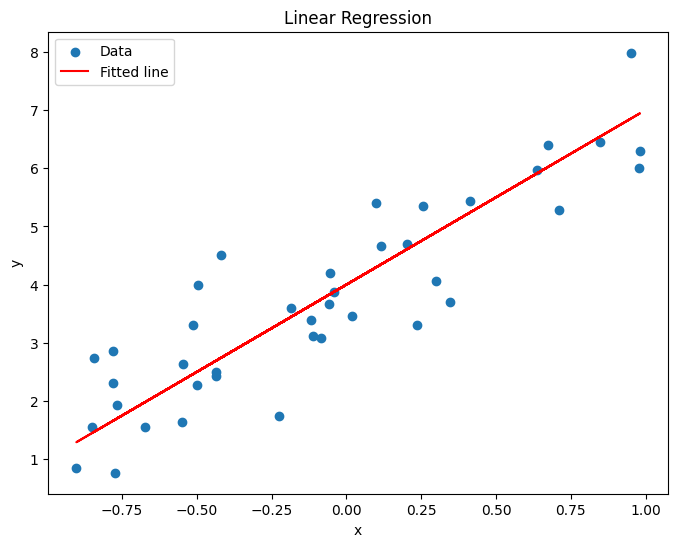

In [11]:
from torch.autograd import grad

x1_t = torch.from_numpy(x1)
y_t = torch.from_numpy(y)

theta0 = torch.tensor(4.0, requires_grad=True)
theta1 = torch.tensor(3.0, requires_grad=True)


y_pred = theta1 * x1_t + theta0


loss = torch.mean((y_pred - y_t) ** 2)

grads = grad(outputs=loss, inputs=[theta1, theta0], create_graph=True)

print("Gradient w.r.t. theta1:", grads[0])
print("Gradient w.r.t. theta0:", grads[1])


plt.figure(figsize=(8, 6))
plt.scatter(x1_t.numpy(), y_t.numpy(), label='Data')  # Scatter plot of the original data
plt.plot(x1_t.numpy(), y_pred.detach().numpy(), color='red', label='Fitted line')  # Line plot of predictions
plt.xlabel('x')
plt.ylabel('y')
plt.title('Linear Regression')
plt.legend()
plt.show()




2) Using the same (thetha1,thetha2) as above, calculate the stochastic gradient for all points in the dataset. Then, find the average of all those gradients and show that the stochastic gradient is a good estimate of the true gradient.


In [12]:
thetha0 = torch.tensor(4.0, requires_grad=True)
thetha1 = torch.tensor(3.0, requires_grad=True)

y_pred = thetha0 + x1_t*thetha1

grad_thetha0_list = []
grad_thetha1_list = []
# Since we need to calculate SGD, we need gradient values at each point.

for i in range(num_samples):

    x_i = x1_t[i]
    y_i = y_t[i]

    y_pred_i = thetha0 + x_i*thetha1

    loss = torch.mean((y_pred_i-y_i)**2)

    grads = grad(inputs=[thetha1,thetha0], outputs=loss, create_graph=True)

    grad_thetha0_list.append(grads[1])
    grad_thetha1_list.append(grads[0])

avg_grad_thetha0 = sum(grad_thetha0_list)/num_samples
avg_grad_thetha1 = sum(grad_thetha1_list)/num_samples

print('The average of all Stochastic gradients w.r.t thetha0 is:',avg_grad_thetha0)
print('The average of all Stochastic gradients w.r.t thetha1 is:',avg_grad_thetha1)

The average of all Stochastic gradients w.r.t thetha0 is: tensor(0.0448, grad_fn=<DivBackward0>)
The average of all Stochastic gradients w.r.t thetha1 is: tensor(0.1922, grad_fn=<DivBackward0>)


As we can see above the results of 1.1, the gradient w.r.t thetha0 is 0.0448 and thetha1 is 0.1922.
We get the exact same values thrpugh SGD calculation and averaging all values.
So, SGD is good estimate of true gradient.

In [10]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML


# Convert to tensors
x_sample = torch.tensor(x1, dtype=torch.float32)
y_sample = torch.tensor(y, dtype=torch.float32)

# Initialize theta0, theta1 as torch tensors
theta0 = torch.tensor(0.0, requires_grad=True)
theta1 = torch.tensor(0.0, requires_grad=True)

theta0_history = []
theta1_history = []
loss_history = []

def stochastic_gradient(lr, epsilon=0.001, max_epochs=1000):
    global theta0, theta1
    prev_loss = float('inf')

    for epoch in range(max_epochs):
        # Shuffle the data for stochastic gradient descent
        indices = torch.randperm(len(x_sample))
        for index in indices:
            # Use a single sample for SGD
            x_single = x_sample[index]
            y_single = y_sample[index]


            y_pred = theta1 * x_single + theta0
            loss = (y_pred - y_single) ** 2

            # Compute gradients
            grads = torch.autograd.grad(outputs=loss, inputs=[theta1, theta0])

            # Update parameters
            theta0_new = theta0 - lr * grads[1].detach()
            theta1_new = theta1 - lr * grads[0].detach()

            # Update parameters for the next iteration
            theta0 = theta0_new
            theta1 = theta1_new

        # Compute and store loss
        y_pred = theta1 * x_sample + theta0
        epoch_loss = torch.mean((y_pred - y_sample) ** 2).item()
        loss_history.append(epoch_loss)

        # Print the loss for the current epoch
        print(f'Epoch {epoch}: Loss = {epoch_loss:.4f}')

        # Check convergence based on change in loss
        if abs(prev_loss - epoch_loss) < epsilon:
            print(f"Convergence reached after {epoch} epochs.")
            return plot_contour_animation()

        # Update previous loss for next iteration
        prev_loss = epoch_loss


        theta0_history.append(theta0.item())
        theta1_history.append(theta1.item())

    print("Reached max epochs.")
    return plot_contour_animation()


def plot_contour_animation():
    fig, ax = plt.subplots()

    theta0_vals = np.linspace(min(theta0_history) - 2, max(theta0_history) + 2, 100)
    theta1_vals = np.linspace(min(theta1_history) - 2, max(theta1_history) + 2, 100)
    theta0_grid, theta1_grid = np.meshgrid(theta0_vals, theta1_vals)

    # Calculate the loss surface
    def loss_function_grid(theta0, theta1):
        y_pred = theta1 * x_sample + theta0
        return torch.mean((y_pred - y_sample) ** 2).item()

    loss_vals = np.array([[loss_function_grid(t0, t1) for t1 in theta1_vals] for t0 in theta0_vals])

    # Animation function
    def animate(epoch):
        ax.clear()
        ax.contourf(theta0_grid, theta1_grid, loss_vals, levels=50, cmap='viridis')
        ax.plot(theta0_history[:epoch+1], theta1_history[:epoch+1], 'r-o')
        ax.set_title(f'Epoch {epoch}')
        ax.set_xlabel('theta0')
        ax.set_ylabel('theta1')

    anim = FuncAnimation(fig, animate, frames=len(theta0_history), repeat=False)
    plt.close(fig)
    return HTML(anim.to_jshtml())

# Plot loss vs epochs
def plot_loss_vs_epochs(loss_history):
    plt.figure(figsize=(8, 6))
    plt.plot(loss_history, label='Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Loss vs. Epochs')
    plt.grid(True)
    plt.legend()
    plt.show()

# Run stochastic gradient descent
stochastic_gradient(lr=0.01)


Epoch 0: Loss = 4.8978
Epoch 1: Loss = 2.1809
Epoch 2: Loss = 1.3826
Epoch 3: Loss = 1.0386
Epoch 4: Loss = 0.8580
Epoch 5: Loss = 0.7538
Epoch 6: Loss = 0.6914
Epoch 7: Loss = 0.6545
Epoch 8: Loss = 0.6317
Epoch 9: Loss = 0.6164
Epoch 10: Loss = 0.6089
Epoch 11: Loss = 0.6032
Epoch 12: Loss = 0.6019
Epoch 13: Loss = 0.5992
Epoch 14: Loss = 0.5981
Epoch 15: Loss = 0.5977
Convergence reached after 15 epochs.


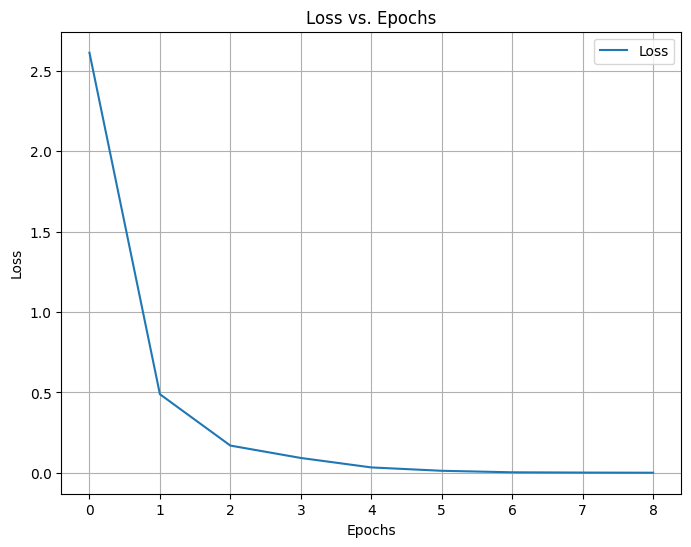

In [ ]:
plot_loss_vs_epochs(loss_history)

Convergence reached after 344 epochs.


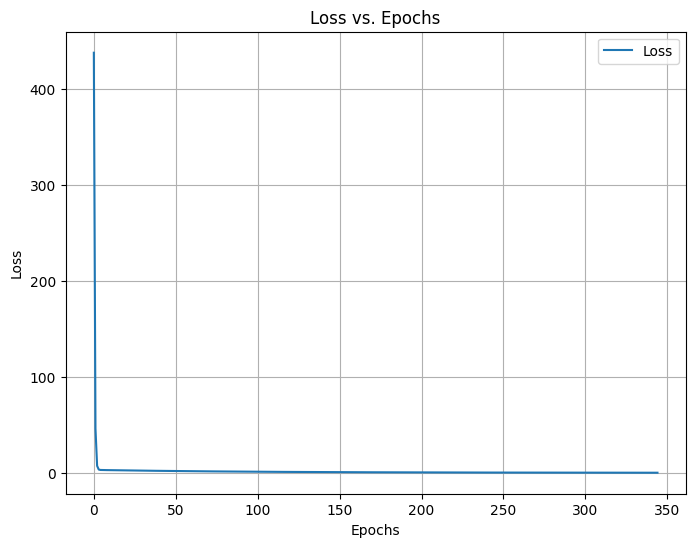

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

theta0 = torch.tensor(0.0, requires_grad=True)
theta1 = torch.tensor(0.0, requires_grad=True)

theta0_history = []
theta1_history = []
loss_history = []




def full_batch_gradient_descent(lr, epsilon=0.001, max_epochs=1000):
    global theta0, theta1
    prev_loss = float('inf')

    for epoch in range(max_epochs):

        y_pred = theta1 * x1 + theta0
        loss = torch.mean((y_pred - y) ** 2)


        grads = torch.autograd.grad(outputs=loss, inputs=[theta1, theta0])


        theta0_new = theta0 - lr * grads[1].detach()
        theta1_new = theta1 - lr * grads[0].detach()


        theta0_history.append(theta0_new.item())
        theta1_history.append(theta1_new.item())
        loss_history.append(loss.item())


        if abs(prev_loss - loss.item()) < epsilon:
            print(f"Convergence reached after {epoch} epochs.")
            break

        # Update the current parameters for the next iteration
        theta0 = theta0_new
        theta1 = theta1_new
        prev_loss = loss.item()

    return theta0_history, theta1_history, loss_history, epoch + 1

# Function to compute loss values for a grid of theta0 and theta1
def compute_loss_grid(theta0_vals, theta1_vals):
    loss_vals = np.zeros((len(theta0_vals), len(theta1_vals)))
    for i, t0 in enumerate(theta0_vals):
        for j, t1 in enumerate(theta1_vals):
            y_pred = t1 * x1 + t0
            loss_vals[i, j] = torch.mean((y_pred - y) ** 2).item()
    return loss_vals

def plot_loss_vs_epochs(loss_history):
    plt.figure(figsize=(8, 6))
    plt.plot(loss_history, label='Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Loss vs. Epochs')
    plt.grid(True)
    plt.legend()
    plt.show()

# Animation function
def plot_contour_animation(theta0_vals, theta1_vals):
    # Compute the 2D loss surface
    loss_grid = compute_loss_grid(theta0_vals, theta1_vals)

    fig, ax = plt.subplots()

    # Animation function
    def animate(epoch):
        ax.clear()
        ax.contourf(theta0_vals, theta1_vals, loss_grid, levels=50, cmap='viridis')  # Pass the loss surface
        ax.plot(theta0_history[:epoch+1], theta1_history[:epoch+1], 'r-o')
        ax.set_title(f'Epoch {epoch}')
        ax.set_xlabel('theta0')
        ax.set_ylabel('theta1')

    # Create animation
    anim = FuncAnimation(fig, animate, frames=len(theta0_history), repeat=False)

    plt.close(fig)
    return HTML(anim.to_jshtml())

theta0_history, theta1_history, loss_history, epochs = full_batch_gradient_descent(lr=0.01)

plot_loss_vs_epochs(loss_history)


In [ ]:
# Generate a grid of theta0 and theta1 values
theta0_vals = np.linspace(min(theta0_history) - 2, max(theta0_history) + 2, 100)
theta1_vals = np.linspace(min(theta1_history) - 2, max(theta1_history) + 2, 100)

plot_contour_animation(theta0_vals, theta1_vals)

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

theta0 = torch.tensor(0.0, requires_grad=True)
theta1 = torch.tensor(0.0, requires_grad=True)

theta0_history = []
theta1_history = []
loss_history = []


def mini_batch_gradient(lr, batch_size=10, epsilon=0.001, max_epochs=1000):
    global theta0, theta1
    n_samples = len(x1)

    prev_loss = float('inf')  # Initialize previous loss

    for epoch in range(max_epochs):
        # Shuffle the data at the beginning of each epoch
        indices = torch.randperm(n_samples)
        x1_shuffled = x1[indices]
        y_shuffled = y[indices]

        epoch_loss = 0  # Reset epoch loss

        # Iterate through mini-batches
        for i in range(0, n_samples, batch_size):
            x_batch = x1_shuffled[i:i+batch_size]
            y_batch = y_shuffled[i:i+batch_size]

            # Compute predictions and loss
            y_pred = theta1 * x_batch + theta0
            loss = torch.mean((y_pred - y_batch) ** 2)

            # Compute gradients for theta0 and theta1
            grads = torch.autograd.grad(outputs=loss, inputs=[theta1, theta0])

            # Update parameters
            theta0_new = theta0 - lr * grads[1].detach()
            theta1_new = theta1 - lr * grads[0].detach()

            theta0 = theta0_new
            theta1 = theta1_new

            # Accumulate the loss for the epoch
            epoch_loss += loss.item()


        epoch_loss /= (n_samples // batch_size)
        loss_history.append(epoch_loss)  # Track loss history

        # Track the parameter history
        theta0_history.append(theta0.item())
        theta1_history.append(theta1.item())

        # Check convergence based
        if abs(prev_loss - epoch_loss) < epsilon:
            print(f"Convergence reached after {epoch} epochs.")
            break

        # Update previous loss for the next iteration
        prev_loss = epoch_loss

    print("Reached max epochs.")
    return plot_contour_animation()

# Plot contour and parameter trajectory animation
def plot_contour_animation():
    fig, ax = plt.subplots()

    theta0_vals = np.linspace(min(theta0_history) - 2, max(theta0_history) + 2, 100)
    theta1_vals = np.linspace(min(theta1_history) - 2, max(theta1_history) + 2, 100)
    theta0_grid, theta1_grid = np.meshgrid(theta0_vals, theta1_vals)

    # Calculate the loss surface
    def loss_function_grid(theta0, theta1):
        y_pred = theta1 * x1 + theta0
        return torch.mean((y_pred - y) ** 2).item()

    loss_vals = np.array([[loss_function_grid(t0, t1) for t1 in theta1_vals] for t0 in theta0_vals])

    # Animation function
    def animate(epoch):
        ax.clear()
        ax.contourf(theta0_grid, theta1_grid, loss_vals, levels=50, cmap='viridis')
        ax.plot(theta0_history[:epoch+1], theta1_history[:epoch+1], 'r-o')
        ax.set_title(f'Epoch {epoch}')
        ax.set_xlabel('theta0')
        ax.set_ylabel('theta1')

    # Create animation
    anim = FuncAnimation(fig, animate, frames=len(theta0_history), repeat=False)
    plt.close(fig)
    return HTML(anim.to_jshtml())

# Plot loss vs epochs
def plot_loss_vs_epochs(loss_history):
    plt.figure(figsize=(8, 6))
    plt.plot(loss_history, label='Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Loss vs. Epochs')
    plt.grid(True)
    plt.legend()
    plt.show()

mini_batch_gradient(lr=0.01, batch_size=10)


Convergence reached after 31 epochs.
Reached max epochs.


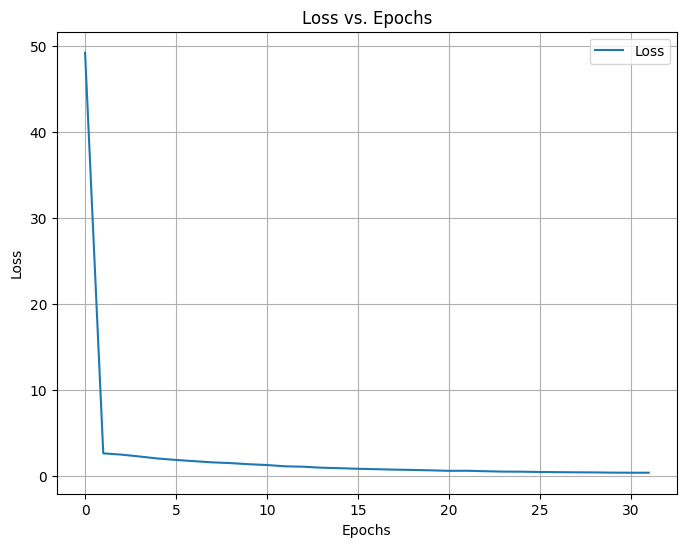

In [ ]:
plot_loss_vs_epochs(loss_history)

Average number of epochs taken for each type of gradient descent
Full-Batch : 344 ,
Mini_Batch : 39.2 ,
Stochastic : 8 .